In [1]:
from geopandas import GeoDataFrame, GeoSeries
from shapely.geometry import Point, Polygon, MultiPolygon
from pyproj import CRS
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
import pandas as pd
import pyproj
import fiona
import boto3

## Here are the datasets we will use for our analysis:

In [2]:
# https://catalog.data.gov/dataset/tiger-line-shapefile-2017-nation-u-s-current-state-and-equivalent-national
states = gpd.read_file('C:/Users/ryane/Documents/Github/Flood-Analysis/data/Census-State/tl_2017_us_state.shp')
states.crs = fiona.crs.from_epsg(4326)
# https://ais-faa.opendata.arcgis.com/datasets/e747ab91a11045e8b3f8a3efd093d3b5_0
airports = gpd.read_file('C:/Users/ryane/Documents/Github/Flood-Analysis/data/FAA-Airports/Airports.shp')
airports.crs = fiona.crs.from_epsg(4326)
# https://catalog.data.gov/dataset/tiger-line-shapefile-2019-nation-u-s-current-metropolitan-statistical-area-micropolitan-statist
us_cbsa = gpd.read_file('C:/Users/ryane/Documents/Github/Flood-Analysis/data/Census-CBSA/tl_2019_us_cbsa.shp')
us_cbsa.crs = fiona.crs.from_epsg(4326)
# http://www2.census.gov/programs-surveys/ahs/2017/AHS%202017%20National%20PUF%20v3.0%20Flat%20CSV.zip?#
ahs_data = pd.read_csv('C:/Users/ryane/Documents/Github/Flood-Analysis/data/Census-AHS/ahs2017n.csv', usecols=['OMB13CBSA', 'DPFLDINS'])

## Functions:

In [3]:
def meters_to_degrees(distance_meters):
    #https://sciencing.com/convert-distances-degrees-meters-7858322.html (111,139)
    distance_degrees = (distance_meters / 111194.926644559) # number derived from matlab calculations
    return distance_degrees

In [4]:
def df_to_gdf(df, what_on): #This function merges the human or machine labeled DF with image metadata to make a GDF for floods
    
    merged_df = df.merge(image_metadata_gdf, on=what_on)
    clean_df = merged_df.dropna()
    gdf = GeoDataFrame(clean_df, crs=fiona.crs.from_epsg(4326))
    
    return gdf

In [5]:
def label_join(label):  #This performs a spacial join for any given GDF this will tell us which state eaach image was taken in
    label_by_state = gpd.sjoin(label, states, op='within')
    label_by_state = label_by_state.drop(columns=['index_right'])
    
    return(label_by_state)

In [6]:
def images_per_cbsa(label, cbsa): #This will tell us how many points from your GDF(label) were found within each cbsa code
    image_counter = {}

    images_within_cbsa = gpd.sjoin(label, cbsa, how='left', op='within')
    images = images_within_cbsa.NAMELSAD.tolist()

    for i in images:
        if i not in image_counter:
            image_counter[i] = images.count(i)

    image_counter = pd.DataFrame.from_dict(image_counter, orient='index')
    
    
    return image_counter

In [7]:
def get_column_values(dataset_name, dataset_column): #This function returns a dictionary that tells us how many of each value was found for a given column in a dataset
    column_dictionary_counter = {} 
    values = dataset_name[dataset_column].tolist()
    for i in values:
        if i not in column_dictionary_counter:
            column_dictionary_counter[i] = values.count(i)
            
    return(column_dictionary_counter)

In [8]:
def months_with_images(state_abbreviation, label, year): #This function returns a dictionary telling the user how many photos were taken each month for the given dataset
    images_by_state = label_join(label)

    state_images = images_by_state[images_by_state.STUSPS == state_abbreviation]
    state_images_timestamp = state_images[state_images['timestamp'].str.contains(year, na=False, case=True)]
    

    stamps = {}
    for i in range(len(state_images_timestamp.timestamp)):
        stamp = pd.Timestamp(state_images_timestamp.timestamp.iloc[i])
        if stamp.month_name() not in stamps:
            state_images_per_month = 0
            
            for j in range(len(state_images_timestamp.timestamp)):
                stamp_count = pd.Timestamp(state_images_timestamp.timestamp.iloc[j])
                if stamp.month_name() == stamp_count.month_name():
                    state_images_per_month += 1
                stamps[stamp.month_name()] = state_images_per_month
    return(print(stamps))

In [9]:
def flood_insurance_by_cbsa(cbsa_values): #This function is used to find out the percentage of people in each cbsa code that have flood insurance
    has_flood_insurance = ["'2'", "'1'", "'3'"]
    cbsa_dict = {}
    percent_with_fldins = {}

    for i in cbsa_values.keys():
        temp_lst = []
        for idx in range(len(ahs_data.OMB13CBSA)):
            if i == ahs_data.OMB13CBSA.loc[idx]:
                temp_lst.append(ahs_data.DPFLDINS.loc[idx])
        cbsa_dict[i] = temp_lst

    for i in cbsa_dict.keys():
        temp = 0
        values = cbsa_dict.get(i)
        for idx in has_flood_insurance:
            x = values.count(idx)
            temp += x
        percent_with_fldins[i] = temp/cbsa_values.get(i)       
        
    return(cbsa_dict, percent_with_fldins)

## Now we can read in the LADI images metadata from it's Amazon S3 bucket:

In [10]:
bucket_name = 'ladi'
file_1_path = 'Labels/ladi_images_metadata.csv'
client = boto3.client('s3')

In [11]:
obj_1 = client.get_object(Bucket = bucket_name, Key = file_1_path)

image_metadata = pd.read_csv(obj_1['Body'])
image_metadata_renamed = image_metadata.rename(columns={"uuid": "image_uuid"})
image_metadata_clean = image_metadata_renamed.dropna()

latitude = image_metadata_clean['gps_lat'].tolist() 
longitude = image_metadata_clean['gps_lon'].tolist()

#This line converts the DF to a GDF and sets the proper crs
image_metadata_gdf = GeoDataFrame(image_metadata_clean, crs=fiona.crs.from_epsg(4326), geometry=gpd.points_from_xy(longitude, latitude))


In [12]:
image_metadata_gdf

,image_uuid,timestamp,gps_lat,gps_lon,gps_alt,file_size,width,height,s3_path,url,geometry
0,a13fb353cca1f5e8060f95c80deb0c49e9a21f91,2016-01-16 07:34:55,29.623744,-95.652153,26.0,3497125.0,4608.0,3456.0,s3://ladi/Images/FEMA_CAP/1012/20118/VIRB0002_...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-95.65215 29.62374)
1,03e5da2bc5e32cd7d58a164eefce499e2f14e06f,2014-06-24 13:09:20,32.386939,-86.344467,489.0,3518243.0,4608.0,3456.0,s3://ladi/Images/FEMA_CAP/1012/20118/VIRB0820_...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-86.34447 32.38694)
4,1c702459e21e5a7e7fec5eefaab42f5e5124113a,2014-06-24 11:21:07,32.371777,-86.345887,459.0,8385536.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/1012/20118/_DSC0126_...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-86.34589 32.37178)
11,12b30b81f509e96c71e69ed14acdd5f7617a51b8,2015-10-06 10:06:54,33.698817,-80.510262,465.0,1768628.0,3216.0,2136.0,s3://ladi/Images/FEMA_CAP/1013/20138/007_56eef...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-80.51026 33.69882)
12,f148c807aac245a66b11cdb925efa22ab5d5a4da,2015-10-06 10:07:00,33.701598,-80.511637,446.0,1782215.0,3216.0,2136.0,s3://ladi/Images/FEMA_CAP/1013/20138/008_8269b...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-80.51164 33.70160)
...,...,...,...,...,...,...,...,...,...,...,...
580746,95fabbdbbb494beab517b5fea25a4e430d8fbcef,2020-01-27 12:01:31,18.002950,-66.896370,101.8,3413576.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-66.89637 18.00295)
580747,4b590e5634dae396db6c838844d7670e5ef9e7f6,2020-01-27 12:00:25,18.003440,-66.896118,101.8,3307879.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-66.89612 18.00344)
580748,bb7f86f1e9ab1a1ab3ea9e13cda998ab6e1bbb6d,2020-01-27 12:02:25,18.003280,-66.895955,101.8,3989427.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-66.89596 18.00328)
580749,c9e5c19cb7cccf181d11b707f1a47b80341710b6,2020-01-27 12:00:45,18.003355,-66.896256,101.8,3722615.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-66.89626 18.00335)


## Now we can read in the LADI human labels specifically those labeled 'damage' or 'flood':

In [13]:
#################### CLEAN AND VALIDATE LADI HUMAN LABELS #########################
human_label_filepath = "Labels/ladi_aggregated_responses_url.tsv"
obj_2 = client.get_object(Bucket = bucket_name, Key = human_label_filepath)
human_label_file = pd.read_csv(obj_2['Body'],sep = '\t' )

#STRIP OFF BRACKET AND COMMA FROM THE ANSWER CATEGORY
human_label_file["Answer"] = human_label_file["Answer"].str.strip('[|]')
human_label_file["Answer"] = human_label_file["Answer"].str.split(",",expand = True)

#EXTRACT LABELS WITH DAMAGE AND INFRASTRUCTURE CATEGORIES AND REMOVE THOSE LABELED 'NONE'
label_damage_infra = human_label_file[human_label_file['Answer'].str.contains('damage|infrastructure',na=False,case=False)]
label_clean = label_damage_infra[~label_damage_infra['Answer'].str.contains('none',na=False,case=False)]
human_flood_label = label_clean[label_clean['Answer'].str.contains('flood',na=False,case=False)]
human_damage_label = label_clean[label_clean['Answer'].str.contains('damage',na=False,case=False)]

In [14]:
human_damage_label

,url,WorkerId,Answer
0,https://ladi.s3-us-west-2.amazonaws.com/Images...,0,'damage:flood/water'
1,https://ladi.s3-us-west-2.amazonaws.com/Images...,1,'damage:flood/water'
2,https://ladi.s3-us-west-2.amazonaws.com/Images...,2,'damage:flood/water'
3,https://ladi.s3-us-west-2.amazonaws.com/Images...,20,'damage:flood/water'
4,https://ladi.s3-us-west-2.amazonaws.com/Images...,0,'damage:flood/water'
...,...,...,...
289824,https://ladi.s3-us-west-2.amazonaws.com/Images...,496,'damage:misc'
289825,https://ladi.s3-us-west-2.amazonaws.com/Images...,513,'damage:rubble'
289826,https://ladi.s3-us-west-2.amazonaws.com/Images...,488,'damage:flood/water'
289830,https://ladi.s3-us-west-2.amazonaws.com/Images...,495,'damage:misc'


In [15]:
human_labeled_damage = df_to_gdf(human_damage_label, 'url')

In [16]:
print(len(human_labeled_damage))

61054


In [17]:
print(len(human_flood_label))

28921


In [18]:
human_labeled_floods = df_to_gdf(human_flood_label, 'url')

In [19]:
human_labeled_floods.columns

Index(['url', 'WorkerId', 'Answer', 'image_uuid', 'timestamp', 'gps_lat',
       'gps_lon', 'gps_alt', 'file_size', 'width', 'height', 's3_path',
       'geometry'],
      dtype='object')

In [20]:
print(len(human_labeled_floods))

28865


## Below is the code to read in the Ladi machine labels (~10 mins @ 100Mbps):

#################### CLEAN AND VALIDATE LADI MACHINE LABELS #########################

machine_label_filepath = "Labels/ladi_machine_labels.csv"
obj_3 = client.get_object(Bucket = bucket_name, Key = machine_label_filepath)
machine_flood_label = pd.read_csv(obj_3['Body'], usecols=['image_uuid', 'label_text'])
machine_flood_label_clean = machine_flood_label[machine_flood_label['label_text'].str.contains('flood', na=False,case=False)]

machine_labeled_floods = df_to_gdf(machine_flood_label_clean, 'image_uuid')

print(len(machine_labeled_floods))

lst = []
for i in machine_labeled_floods.timestamp:
    if timestamp.str.contains('2019'):
        lst.append(i)
print(len(lst))

## Now we can draw a circle around each of the airports at a given radius from the center changing the geometric Points to Polygons:

In [21]:
airports.geometry

0        POINT Z (-176.64250 51.88358 0.00000)
1        POINT Z (-154.18258 56.93869 0.00000)
2        POINT Z (-161.49335 60.91381 0.00000)
3        POINT Z (-161.43510 60.90786 0.00000)
4        POINT Z (-161.23061 60.90290 0.00000)
                         ...                  
20007    POINT Z (-120.32883 46.71496 0.00000)
20008     POINT Z (-95.54501 29.78056 0.00000)
20009     POINT Z (-95.20806 29.58167 0.00000)
20010     POINT Z (-95.43140 29.81195 0.00000)
20011     POINT Z (-97.90595 27.44485 0.00000)
Name: geometry, Length: 20012, dtype: geometry

In [22]:
airports.geometry = airports.geometry.buffer(meters_to_degrees(8046.72)) #equal to 5 miles in meters
airports.geometry

0        POLYGON ((-176.57013 51.88358, -176.57048 51.8...
1        POLYGON ((-154.11021 56.93869, -154.11056 56.9...
2        POLYGON ((-161.42099 60.91381, -161.42133 60.9...
3        POLYGON ((-161.36273 60.90786, -161.36308 60.9...
4        POLYGON ((-161.15824 60.90290, -161.15859 60.8...
                               ...                        
20007    POLYGON ((-120.25647 46.71496, -120.25681 46.7...
20008    POLYGON ((-95.47264 29.78056, -95.47299 29.773...
20009    POLYGON ((-95.13570 29.58167, -95.13605 29.574...
20010    POLYGON ((-95.35903 29.81195, -95.35938 29.804...
20011    POLYGON ((-97.83358 27.44485, -97.83393 27.437...
Name: geometry, Length: 20012, dtype: geometry

## Now we filter out images based on state, the year they were taken and the label dataset:

In [23]:
def airports_in_range(state_abbreviation, label, year):
    
    images_by_state = label_join(label)
    airports_by_state = label_join(airports)
    
    state_images = images_by_state[images_by_state.STUSPS == state_abbreviation]
    state_images_timestamp = state_images[state_images['timestamp'].str.contains(year, na=False, case=True)]
    
    cbsa_by_state = label_join(us_cbsa)
    state_cbsa = cbsa_by_state[cbsa_by_state['STUSPS'].str.contains(state_abbreviation, na=False, case=True)]
    
    num_images_per_cbsa = images_per_cbsa(state_images_timestamp, state_cbsa)
    count = len(state_images_timestamp)
    
    column_values = get_column_values(ahs_data, 'OMB13CBSA')
    temp = flood_insurance_by_cbsa(column_values)
    
    percent_with_fldins = temp[1]
    
    return(state_images_timestamp, state_cbsa, count, num_images_per_cbsa, percent_with_fldins)

## Now we can filter out images based on state, the year they were taken and the label dataset (if the condition is set to true it will plot airports and images that were taken within the buffer radius of the airport (default: 5 miles)):

In [24]:
def state_plotter(state_abbreviation, label, year, conditional): # if the conditional is set to True it will plot images only within range of atleast one of the airports):
    if conditional is True:
        
        images_by_state = label_join(label)
        airports_by_state = label_join(airports) 
        
        ax = states[states.STUSPS == state_abbreviation].plot(figsize=(10,10), alpha = .3, edgecolor = 'k')
        state_airports = airports_by_state[airports_by_state.STUSPS == state_abbreviation]
        
        state_images = images_by_state[images_by_state.STUSPS == state_abbreviation]
        state_images_timestamp = state_images[state_images['timestamp'].str.contains(year, na=False, case=True)]
        
        images_within_range = gpd.sjoin(state_images_timestamp, state_airports, op='within')
        images_within_range = images_within_range.drop(columns=['index_right'])
        images_within_range.plot(ax=ax, marker='.', markersize = 5, color='red', zorder=3)
        airports_within_range = gpd.sjoin(state_airports, state_images_timestamp, op='contains')
        airports_within_range.plot(ax=ax, color='black', alpha=.5, zorder=2)
        
        cbsa_by_state = label_join(us_cbsa)
        state_cbsa = cbsa_by_state[cbsa_by_state['STUSPS'].str.contains(state_abbreviation, na=False, case=True)]
        state_cbsa.plot(ax=ax, alpha= .5, edgecolor = 'black', zorder=1)

        ctx.add_basemap(ax, crs = fiona.crs.from_epsg(4326))
            
        num_images_per_cbsa = images_per_cbsa(images_within_range, state_cbsa)
        count = len(images_within_range)
        
        return(plt.show(), print('Total images: ', count), print(num_images_per_cbsa))
            
    else:
        images_by_state = label_join(label)
        airports_by_state = label_join(airports)
        cbsa_by_state = label_join(us_cbsa)

        
        ax = states[states.STUSPS == state_abbreviation].plot(figsize=(10,10), alpha = .3, edgecolor = 'k')
        state_airports = airports_by_state[airports_by_state.STUSPS == state_abbreviation]
        #state_airports.plot(ax=ax, color='black', alpha = .5, zorder=2)

        state_images = images_by_state[images_by_state.STUSPS == state_abbreviation]
        state_images_timestamp = state_images[state_images['timestamp'].str.contains(year, na=False, case=True)]

        state_images_timestamp.plot(ax=ax, marker='.', markersize = 5, color='red', zorder=3)
        
        cbsa_by_state = label_join(us_cbsa)
        state_cbsa = cbsa_by_state[cbsa_by_state['STUSPS'].str.contains(state_abbreviation, na=False, case=True)]
        state_cbsa.plot(ax=ax, alpha= .5, edgecolor = 'black', zorder=1)
        
        ctx.add_basemap(ax, crs = fiona.crs.from_epsg(4326))
        
        num_images_per_cbsa = images_per_cbsa(state_images_timestamp, state_cbsa)
        count = len(state_images_timestamp)

        return(plt.show(), print('Total images: ', count), print(num_images_per_cbsa))

# Hurricane Michael:
- Makes landfall in Florida on October 10th, 2018
- MICHAEL COMES UP THROUGH THE GULF COAST AND PUSHES NORTH THROUGH TALLAHASSE INTO GEORGIA
- A MAJORITY OF THE IMAGES WERE TAKEN IN OCTOBER (THE SAME MONTH IT HIT) 
- ONLY ONE FOLLOW UP IMAGE TAKEN IN NOVEMBER, 2018

In [25]:
months_with_images('FL', image_metadata_gdf, '2018') #returns the number of images taken in FL in 2018

{'August': 328, 'September': 47, 'October': 11491, 'February': 93, 'November': 80, 'April': 79, 'March': 1, 'January': 7, 'December': 44, 'June': 24}


In [26]:
months_with_images('FL', image_metadata_gdf, '2019')

{'March': 34, 'June': 52, 'January': 9, 'February': 107, 'April': 67, 'July': 141, 'May': 19, 'September': 482, 'November': 8}


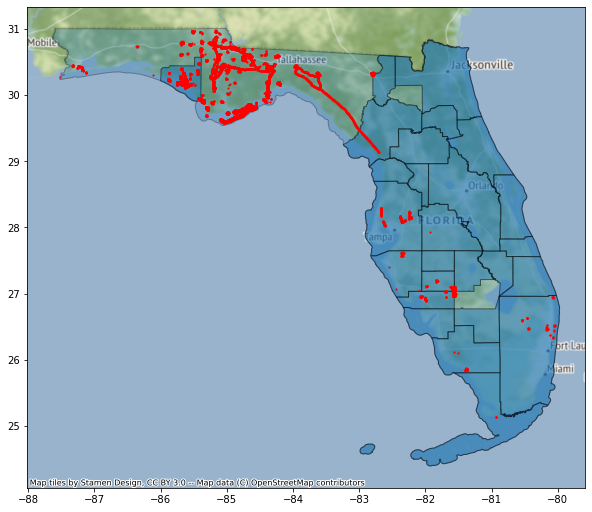

Total images:  12194
                                                       0
Key West, FL Micro Area                                3
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area    61
NaN                                                 9562
Panama City, FL Metro Area                          1822
Gainesville, FL Metro Area                            77
Lake City, FL Micro Area                              38
Tampa-St. Petersburg-Clearwater, FL Metro Area       228
Punta Gorda, FL Metro Area                           178
Arcadia, FL Micro Area                               113
Naples-Marco Island, FL Metro Area                    49
Sebring-Avon Park, FL Metro Area                      34
North Port-Sarasota-Bradenton, FL Metro Area          28
Lakeland-Winter Haven, FL Metro Area                   1


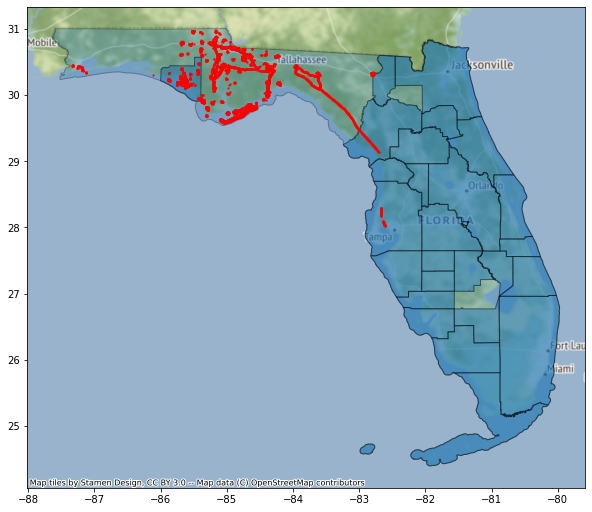

Total images:  11491
                                                   0
NaN                                             9464
Panama City, FL Metro Area                      1822
Gainesville, FL Metro Area                        77
Lake City, FL Micro Area                          38
Tampa-St. Petersburg-Clearwater, FL Metro Area    90


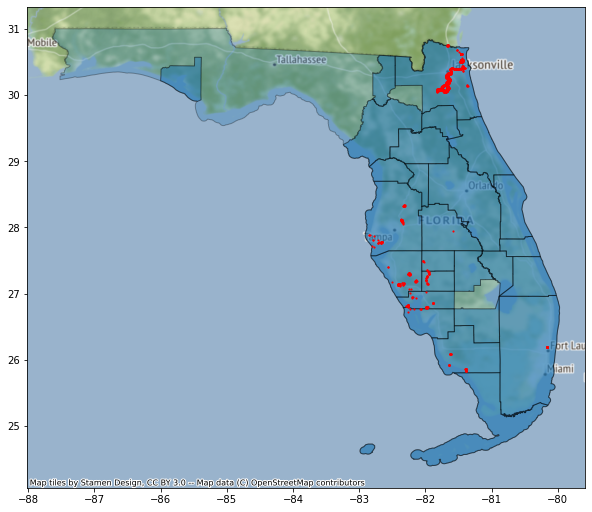

Total images:  919
                                                      0
Tampa-St. Petersburg-Clearwater, FL Metro Area       76
Lakeland-Winter Haven, FL Metro Area                  1
Naples-Marco Island, FL Metro Area                   32
Punta Gorda, FL Metro Area                           59
North Port-Sarasota-Bradenton, FL Metro Area         83
Jacksonville, FL Metro Area                         611
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area   19
Cape Coral-Fort Myers, FL Metro Area                  4
Wauchula, FL Micro Area                               7
Arcadia, FL Micro Area                               27


(None, None, None)

In [28]:
state_plotter('FL', image_metadata_gdf, '2018', False)
state_plotter('FL', image_metadata_gdf, '2018-10', False)
state_plotter('FL', image_metadata_gdf, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

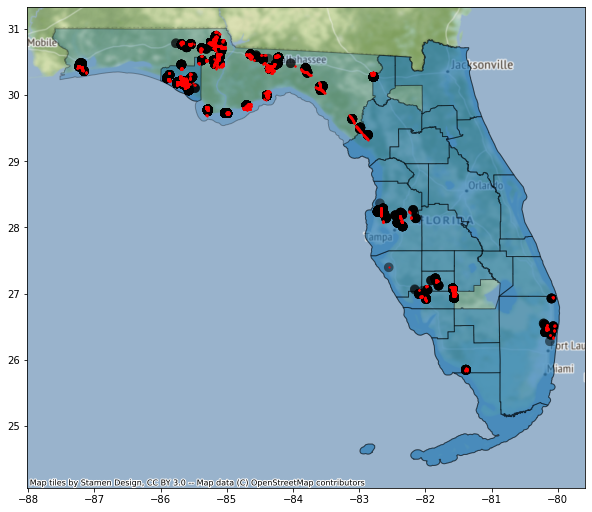

Total images:  9434
                                                       0
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area    92
NaN                                                 3999
Gainesville, FL Metro Area                            36
Panama City, FL Metro Area                          4616
Lake City, FL Micro Area                              38
Tampa-St. Petersburg-Clearwater, FL Metro Area       257
Punta Gorda, FL Metro Area                           176
Arcadia, FL Micro Area                               134
Naples-Marco Island, FL Metro Area                    47
Sebring-Avon Park, FL Metro Area                      34
North Port-Sarasota-Bradenton, FL Metro Area           5


(None, None, None)

In [27]:
state_plotter('FL', image_metadata_gdf, '2018', True)

In [29]:
months_with_images('FL', human_labeled_floods, '2018')

{'October': 154, 'September': 1, 'August': 5, 'November': 1, 'April': 1}


In [30]:
months_with_images('FL', human_labeled_floods, '2019')

{'September': 76, 'July': 5, 'June': 2, 'March': 3, 'April': 4, 'May': 3}


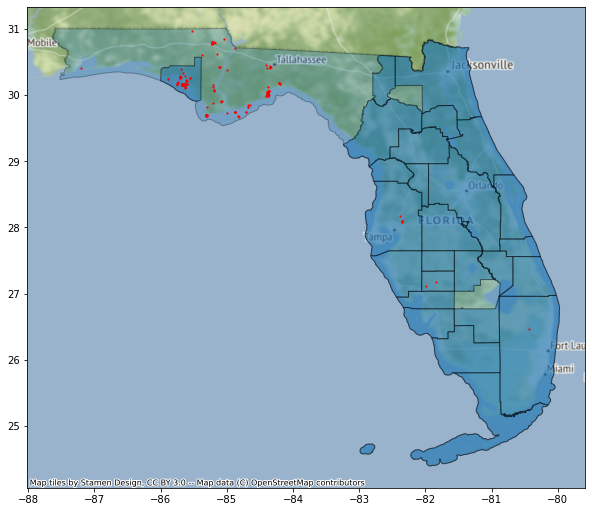

Total images:  162
                                                      0
NaN                                                 103
Panama City, FL Metro Area                           51
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area    1
Tampa-St. Petersburg-Clearwater, FL Metro Area        5
Arcadia, FL Micro Area                                2


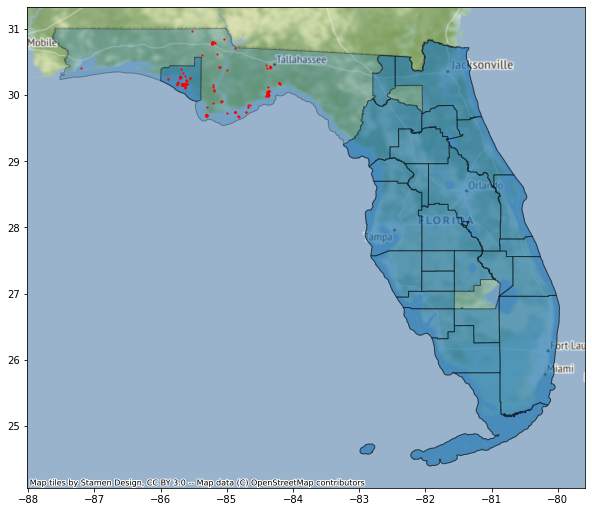

Total images:  154
                              0
NaN                         103
Panama City, FL Metro Area   51


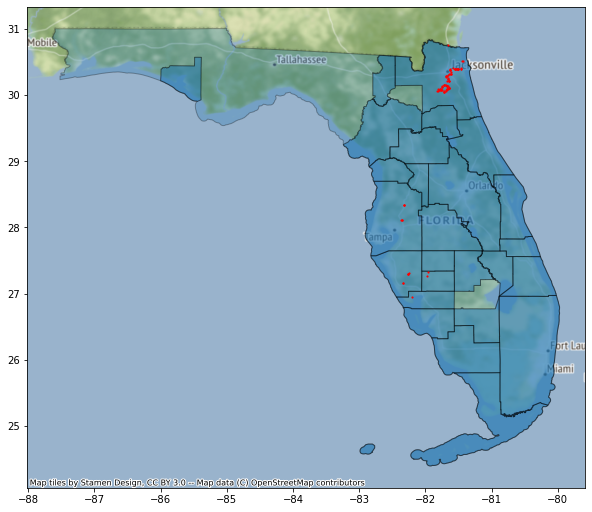

Total images:  93
                                                 0
Jacksonville, FL Metro Area                     78
Arcadia, FL Micro Area                           2
Tampa-St. Petersburg-Clearwater, FL Metro Area   6
North Port-Sarasota-Bradenton, FL Metro Area     6
Punta Gorda, FL Metro Area                       1


(None, None, None)

In [31]:
state_plotter('FL', human_labeled_floods, '2018', False)
state_plotter('FL', human_labeled_floods, '2018-10', False)
state_plotter('FL', human_labeled_floods, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [32]:
months_with_images('GA', image_metadata_gdf, '2018')

{'July': 53, 'October': 1881, 'March': 14, 'May': 7, 'June': 6, 'April': 49, 'September': 9}


In [33]:
months_with_images('GA', image_metadata_gdf, '2019')

{'February': 9, 'September': 14}


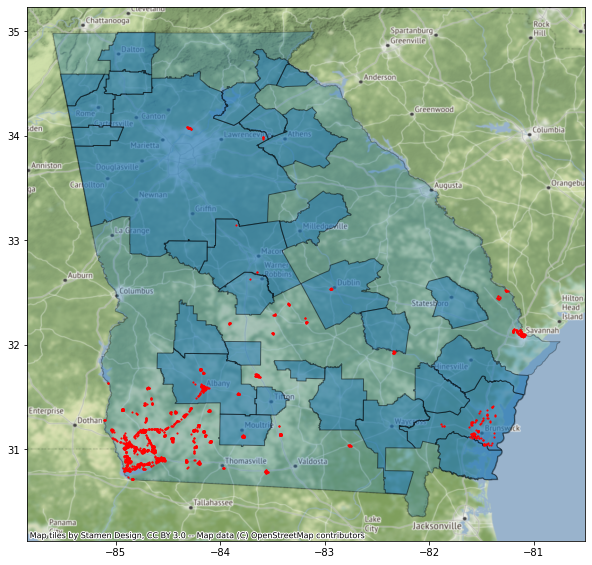

Total images:  2019
                                                    0
Atlanta-Sandy Springs-Alpharetta, GA Metro Area    22
NaN                                              1723
Warner Robins, GA Metro Area                        1
Albany, GA Metro Area                             138
Macon-Bibb County, GA Metro Area                    3
Dublin, GA Micro Area                              10
Moultrie, GA Micro Area                            21
Vidalia, GA Micro Area                              2
Brunswick, GA Metro Area                           95
St. Marys, GA Micro Area                            4


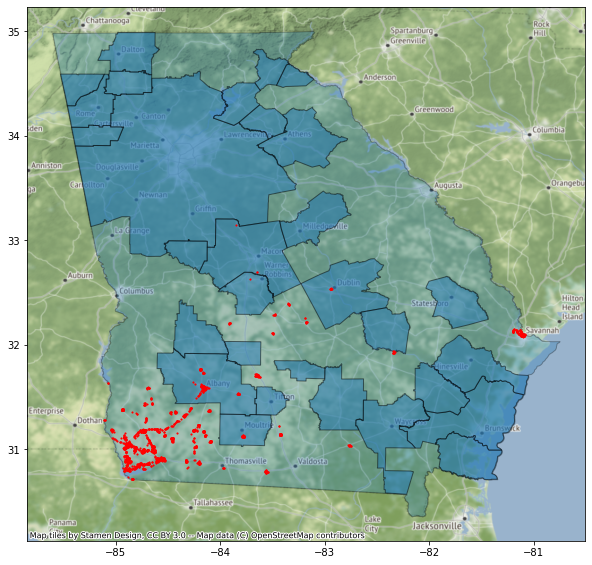

Total images:  1881
                                     0
NaN                               1706
Warner Robins, GA Metro Area         1
Albany, GA Metro Area              138
Macon-Bibb County, GA Metro Area     3
Dublin, GA Micro Area               10
Moultrie, GA Micro Area             21
Vidalia, GA Micro Area               2


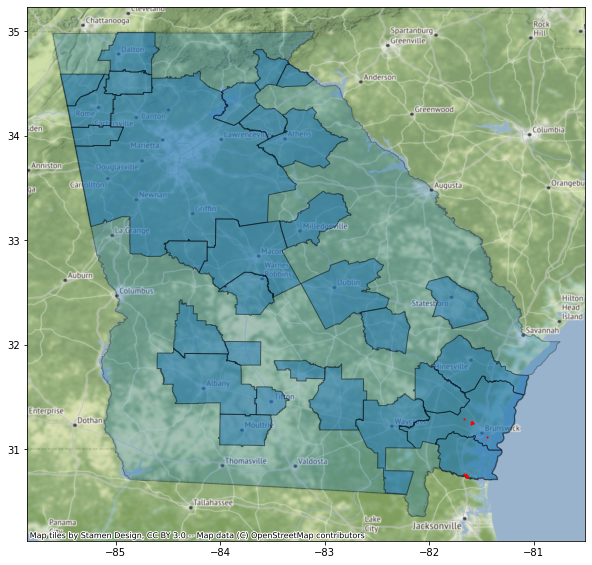

Total images:  23
                           0
Brunswick, GA Metro Area   9
St. Marys, GA Micro Area  14


(None, None, None)

In [34]:
state_plotter('GA', image_metadata_gdf, '2018', False)
state_plotter('GA', image_metadata_gdf, '2018-10', False)
state_plotter('GA', image_metadata_gdf, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [35]:
months_with_images('GA', human_labeled_floods, '2018')

{'October': 15, 'April': 3}


In [36]:
months_with_images('GA', human_labeled_floods, '2019')

{'September': 2}


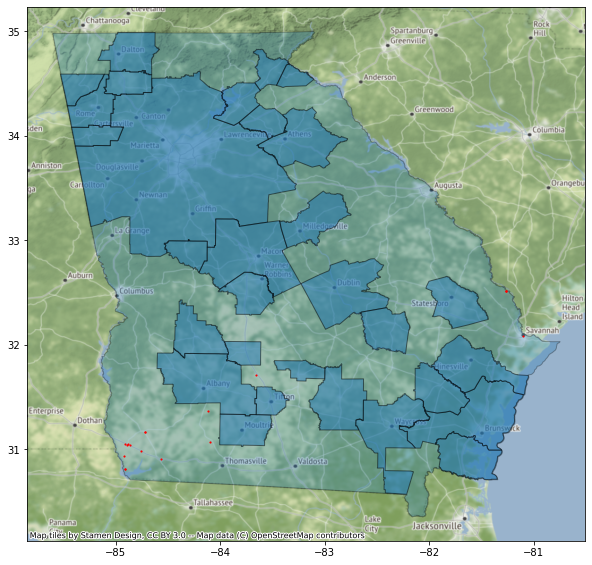

Total images:  18
      0
NaN  18


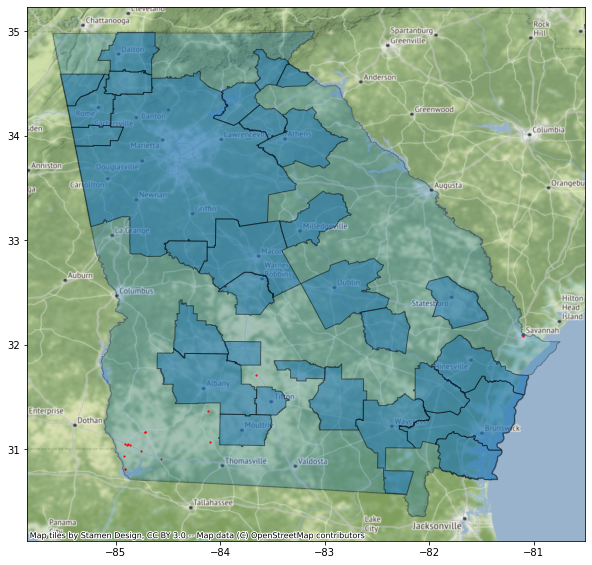

Total images:  15
      0
NaN  15


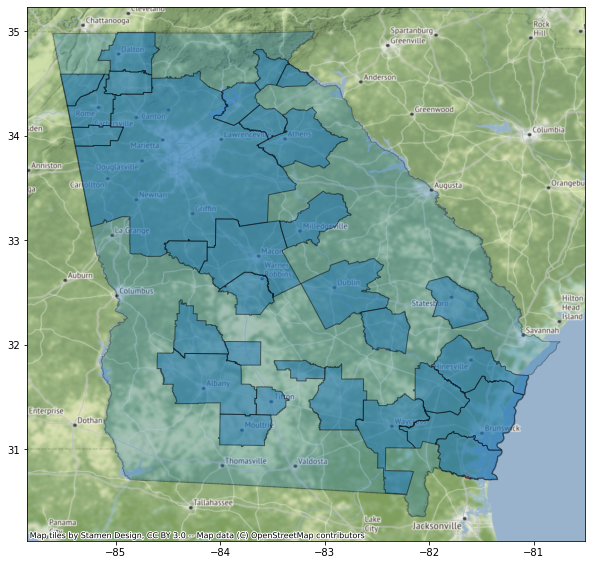

Total images:  2
                          0
St. Marys, GA Micro Area  2


(None, None, None)

In [37]:
state_plotter('GA', human_labeled_floods, '2018', False)
state_plotter('GA', human_labeled_floods, '2018-10', False)
state_plotter('GA', human_labeled_floods, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

# Hurricane Florence:
- HIT CAROLINAS DIRECTLY ALONG COAST LINE (AUGUST 31, 2018-SEPTEMBER 18TH, 2018)
- MAKES LANDFALL IN NC ON SEPTEMBER 14TH
- PUSHES WESTWARD THROUGH THE CAROLINAS AND INTO GEORGIA


In [38]:
months_with_images('NC', image_metadata_gdf, '2018')

{'May': 43, 'July': 501, 'September': 2948, 'January': 376, 'November': 383, 'June': 64, 'October': 146, 'December': 106, 'August': 2, 'February': 64, 'March': 77, 'April': 14}


In [39]:
months_with_images('NC', image_metadata_gdf, '2019')

{'January': 197, 'June': 557, 'February': 217, 'July': 129, 'April': 46, 'August': 142, 'May': 142, 'September': 1014, 'December': 47, 'October': 54}


2018: 


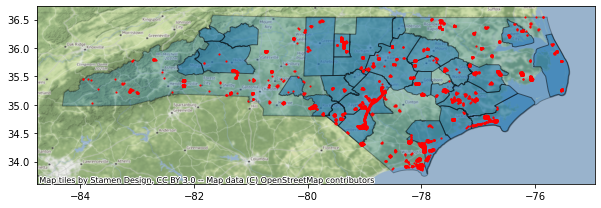

Total images:  4724
                                            0
NaN                                      1691
Albemarle, NC Micro Area                    7
Fayetteville, NC Metro Area               375
Lumberton, NC Micro Area                  380
Burlington, NC Metro Area                 176
Wilmington, NC Metro Area                 503
New Bern, NC Metro Area                   187
Morehead City, NC Micro Area              249
Washington, NC Micro Area                 165
Greenville, NC Metro Area                  40
Elizabeth City, NC Micro Area              63
Kill Devil Hills, NC Micro Area            91
Laurinburg, NC Micro Area                  85
Kinston, NC Micro Area                     71
Greensboro-High Point, NC Metro Area       30
Goldsboro, NC Metro Area                  122
Wilson, NC Micro Area                      28
Rocky Mount, NC Metro Area                 67
Pinehurst-Southern Pines, NC Micro Area    26
Rockingham, NC Micro Area                  32
Jacksonville, 

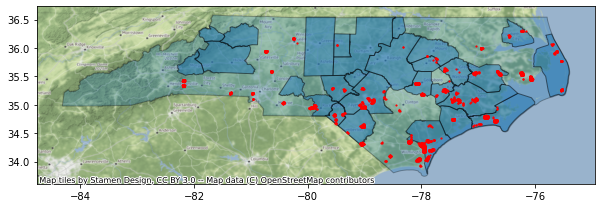

Total images:  2948
                                            0
Fayetteville, NC Metro Area               209
Lumberton, NC Micro Area                  111
NaN                                      1094
Burlington, NC Metro Area                   4
Wilmington, NC Metro Area                 477
New Bern, NC Metro Area                   164
Morehead City, NC Micro Area              203
Washington, NC Micro Area                 125
Greenville, NC Metro Area                  40
Elizabeth City, NC Micro Area              50
Kill Devil Hills, NC Micro Area            91
Laurinburg, NC Micro Area                  63
Kinston, NC Micro Area                     71
Goldsboro, NC Metro Area                  119
Wilson, NC Micro Area                       5
Rocky Mount, NC Metro Area                 12
Pinehurst-Southern Pines, NC Micro Area    26
Rockingham, NC Micro Area                  19
Jacksonville, NC Metro Area                63
Raleigh-Cary, NC Metro Area                 2

OCTOBER 2018:

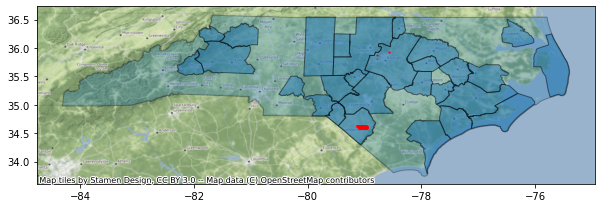

Total images:  146
                               0
Lumberton, NC Micro Area     144
Raleigh-Cary, NC Metro Area    2

NOVEMBER 2018: 


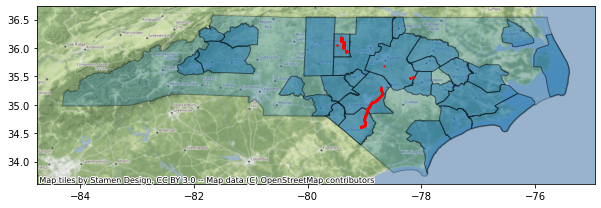

Total images:  383
                               0
Burlington, NC Metro Area    157
Raleigh-Cary, NC Metro Area   11
Lumberton, NC Micro Area     116
Fayetteville, NC Metro Area   99

DECEMBER 2018: 


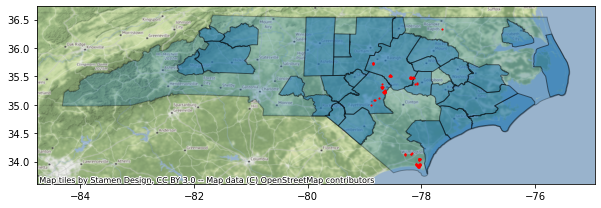

Total images:  106
                              0
Fayetteville, NC Metro Area  33
Raleigh-Cary, NC Metro Area  27
NaN                          43
Goldsboro, NC Metro Area      3

2019: 


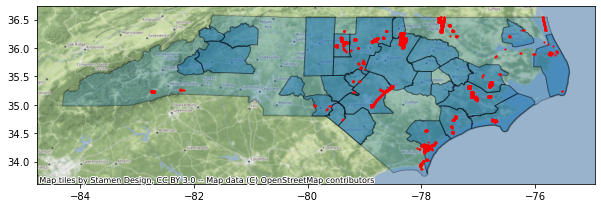

Total images:  2545
                                           0
NaN                                      481
Burlington, NC Metro Area                188
Henderson, NC Micro Area                  49
Raleigh-Cary, NC Metro Area              554
Durham-Chapel Hill, NC Metro Area        156
Pinehurst-Southern Pines, NC Micro Area    3
Sanford, NC Micro Area                     8
Fayetteville, NC Metro Area              151
Kill Devil Hills, NC Micro Area           23
Wilmington, NC Metro Area                270
Jacksonville, NC Metro Area               68
New Bern, NC Metro Area                  423
Rockingham, NC Micro Area                  8
Laurinburg, NC Micro Area                  2
Washington, NC Micro Area                108
Morehead City, NC Micro Area              46
Elizabeth City, NC Micro Area              7


(None, None, None)

In [40]:
print('2018: ')
state_plotter('NC', image_metadata_gdf, '2018', False)
print('\nSEPTEMBER 2018: ')
state_plotter('NC', image_metadata_gdf, '2018-09', False)
print('\nOCTOBER 2018: ')
state_plotter('NC', image_metadata_gdf, '2018-10', False)
print('\nNOVEMBER 2018: ')
state_plotter('NC', image_metadata_gdf, '2018-11', False)
print('\nDECEMBER 2018: ')
state_plotter('NC', image_metadata_gdf, '2018-12', False)
print('\n2019: ')
state_plotter('NC', image_metadata_gdf, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [41]:
months_with_images('NC', human_labeled_floods, '2018')

{'September': 421, 'November': 43, 'December': 41, 'October': 15, 'May': 2, 'July': 7, 'June': 6}


In [42]:
months_with_images('NC', human_labeled_floods, '2019')

{'September': 93, 'August': 1, 'May': 11, 'July': 3}


2018: 


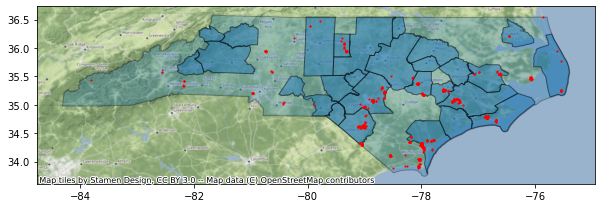

Total images:  535
                                        0
NaN                                   132
Morehead City, NC Micro Area           41
Burlington, NC Metro Area              31
Washington, NC Micro Area              19
Fayetteville, NC Metro Area            58
Lumberton, NC Micro Area               66
New Bern, NC Metro Area                45
Kinston, NC Micro Area                 28
Goldsboro, NC Metro Area               27
Wilmington, NC Metro Area              68
Rockingham, NC Micro Area               1
Raleigh-Cary, NC Metro Area             3
Kill Devil Hills, NC Micro Area        10
Elizabeth City, NC Micro Area           3
Greensboro-High Point, NC Metro Area    3

SEPTEMBER 2018: 


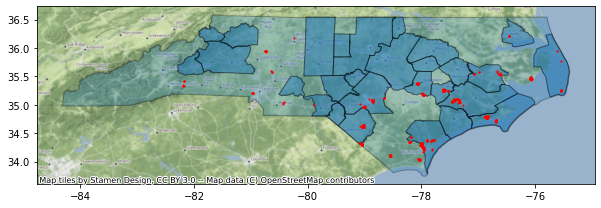

Total images:  421
                                  0
NaN                              99
Morehead City, NC Micro Area     41
Washington, NC Micro Area        19
Lumberton, NC Micro Area         45
New Bern, NC Metro Area          45
Kinston, NC Micro Area           28
Goldsboro, NC Metro Area         27
Fayetteville, NC Metro Area      35
Wilmington, NC Metro Area        68
Rockingham, NC Micro Area         1
Kill Devil Hills, NC Micro Area  10
Elizabeth City, NC Micro Area     3

OCTOBER 2018: 


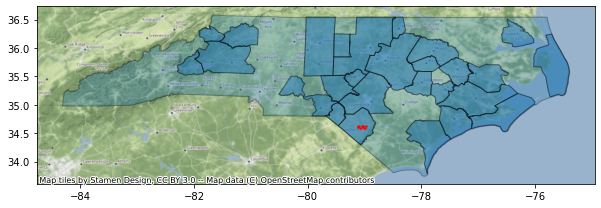

Total images:  15
                           0
Lumberton, NC Micro Area  15

NOVEMBER 2018: 


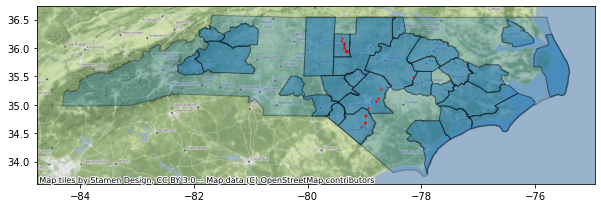

Total images:  43
                              0
Burlington, NC Metro Area    31
Fayetteville, NC Metro Area   5
Lumberton, NC Micro Area      6
Raleigh-Cary, NC Metro Area   1

DECEMBER 2018: 


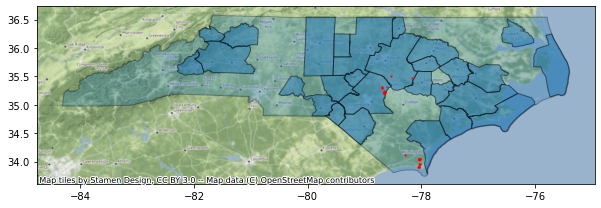

Total images:  41
                              0
NaN                          21
Fayetteville, NC Metro Area  18
Raleigh-Cary, NC Metro Area   2

2019: 


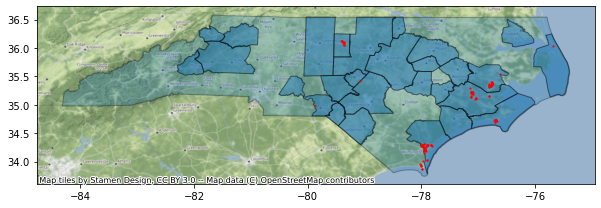

Total images:  108
                                  0
New Bern, NC Metro Area          19
Wilmington, NC Metro Area        36
Morehead City, NC Micro Area      9
Washington, NC Micro Area        22
NaN                               9
Kill Devil Hills, NC Micro Area   1
Sanford, NC Micro Area            1
Burlington, NC Metro Area        11


(None, None, None)

In [43]:
print('2018: ')
state_plotter('NC', human_labeled_floods, '2018', False)
print('\nSEPTEMBER 2018: ')
state_plotter('NC', human_labeled_floods, '2018-09', False)
print('\nOCTOBER 2018: ')
state_plotter('NC', human_labeled_floods, '2018-10', False)
print('\nNOVEMBER 2018: ')
state_plotter('NC', human_labeled_floods, '2018-11', False)
print('\nDECEMBER 2018: ')
state_plotter('NC', human_labeled_floods, '2018-12', False)
print('\n2019: ')
state_plotter('NC', human_labeled_floods, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [44]:
months_with_images('SC', image_metadata_gdf, '2018')

{'September': 6505, 'October': 1257, 'April': 63, 'July': 151, 'June': 8, 'May': 2}


In [45]:
months_with_images('SC', image_metadata_gdf, '2019')

{'January': 34, 'February': 2}


2018: 


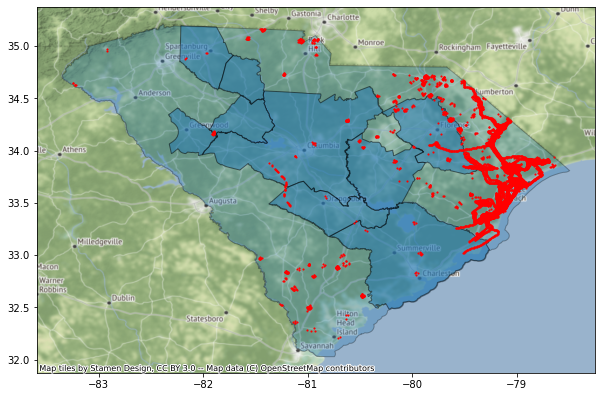

Total images:  7986
                                               0
NaN                                         7424
Florence, SC Metro Area                      351
Sumter, SC Metro Area                         31
Columbia, SC Metro Area                       53
Charleston-North Charleston, SC Metro Area    80
Orangeburg, SC Micro Area                     17
Spartanburg, SC Metro Area                     4
Newberry, SC Micro Area                       14
Greenwood, SC Micro Area                      12

2019: 


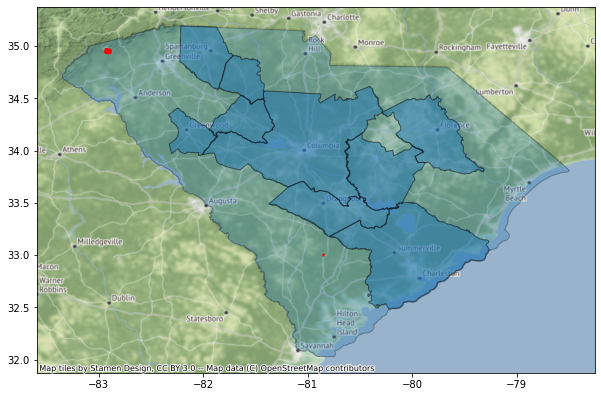

Total images:  36
      0
NaN  36


(None, None, None)

In [46]:
print('2018: ')
state_plotter('SC', image_metadata_gdf, '2018', False)



print('\n2019: ')
state_plotter('SC', image_metadata_gdf, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [47]:
months_with_images('SC', human_labeled_floods, '2018')

{'October': 534, 'September': 1623, 'July': 6, 'April': 3}


In [48]:
months_with_images('SC', human_labeled_floods, '2019')

{}


2018: 


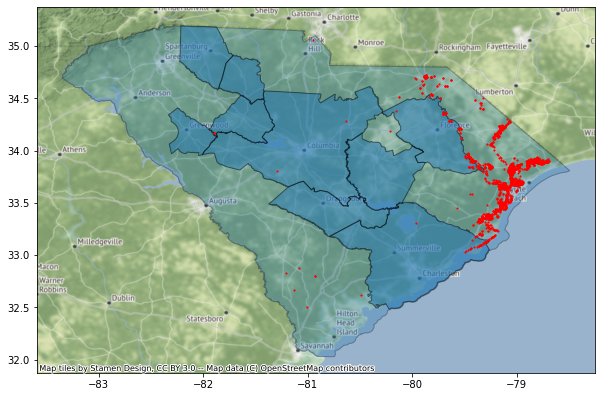

Total images:  2166
                                               0
NaN                                         2065
Florence, SC Metro Area                       59
Charleston-North Charleston, SC Metro Area    37
Newberry, SC Micro Area                        3
Columbia, SC Metro Area                        2

SEPTEMBER 2018: 


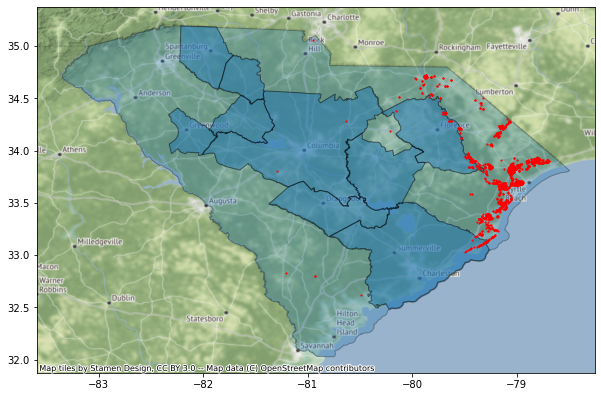

Total images:  1623
                                               0
NaN                                         1526
Florence, SC Metro Area                       59
Charleston-North Charleston, SC Metro Area    36
Columbia, SC Metro Area                        2

OCTOBER 2018: 


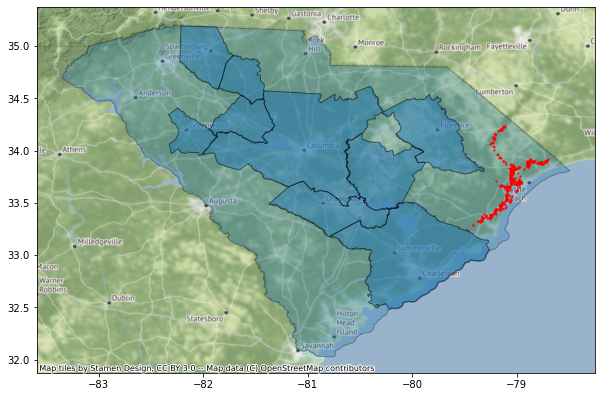

Total images:  534
       0
NaN  534


(None, None, None)

In [49]:
print('2018: ')
state_plotter('SC', human_labeled_floods, '2018', False)
print('\nSEPTEMBER 2018: ')
state_plotter('SC', human_labeled_floods, '2018-09', False)
print('\nOCTOBER 2018: ')
state_plotter('SC', human_labeled_floods, '2018-10', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [50]:
months_with_images('FL', image_metadata_gdf, '2018')

{'August': 328, 'September': 47, 'October': 11491, 'February': 93, 'November': 80, 'April': 79, 'March': 1, 'January': 7, 'December': 44, 'June': 24}


In [51]:
months_with_images('FL', image_metadata_gdf, '2019')

{'March': 34, 'June': 52, 'January': 9, 'February': 107, 'April': 67, 'July': 141, 'May': 19, 'September': 482, 'November': 8}


2018: 


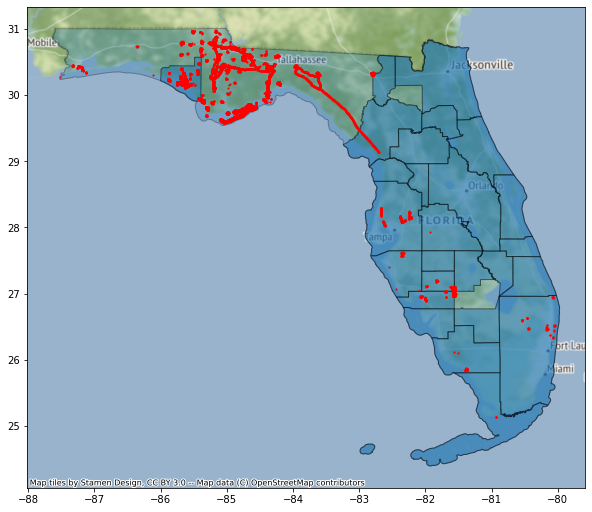

Total images:  12194
                                                       0
Key West, FL Micro Area                                3
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area    61
NaN                                                 9562
Panama City, FL Metro Area                          1822
Gainesville, FL Metro Area                            77
Lake City, FL Micro Area                              38
Tampa-St. Petersburg-Clearwater, FL Metro Area       228
Punta Gorda, FL Metro Area                           178
Arcadia, FL Micro Area                               113
Naples-Marco Island, FL Metro Area                    49
Sebring-Avon Park, FL Metro Area                      34
North Port-Sarasota-Bradenton, FL Metro Area          28
Lakeland-Winter Haven, FL Metro Area                   1

AUGUST 2018: 


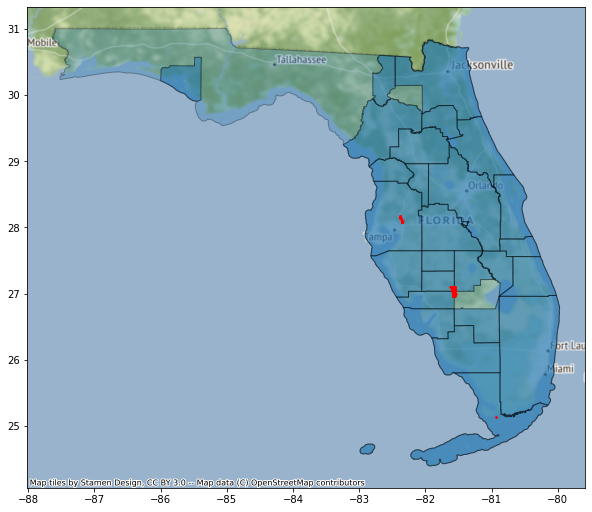

Total images:  328
                                                  0
Key West, FL Micro Area                           3
Tampa-St. Petersburg-Clearwater, FL Metro Area   66
Sebring-Avon Park, FL Metro Area                 34
Arcadia, FL Micro Area                           82
Punta Gorda, FL Metro Area                      111
NaN                                              32

SEPTEMBER 2018: 


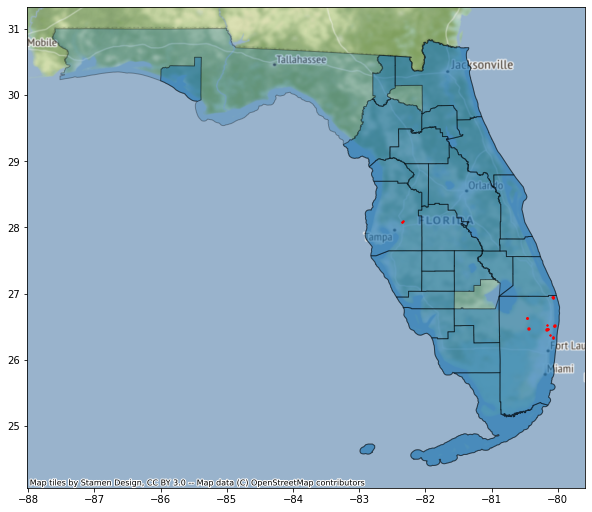

Total images:  47
                                                     0
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area  42
Tampa-St. Petersburg-Clearwater, FL Metro Area       5

OCTOBER 2018: 


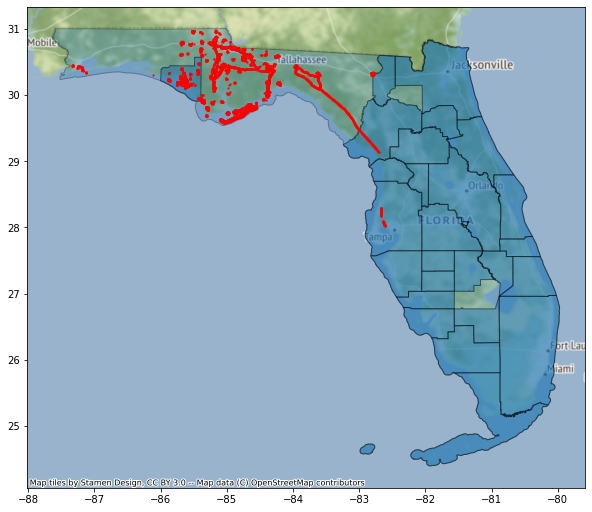

Total images:  11491
                                                   0
NaN                                             9464
Panama City, FL Metro Area                      1822
Gainesville, FL Metro Area                        77
Lake City, FL Micro Area                          38
Tampa-St. Petersburg-Clearwater, FL Metro Area    90

NOVEMBER 2018: 


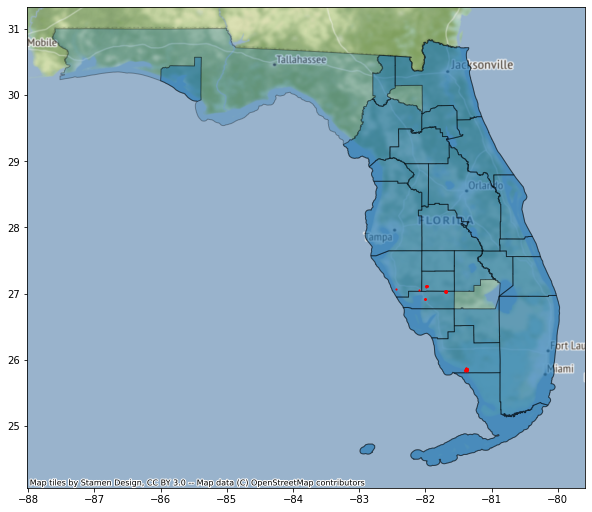

Total images:  80
                                               0
Punta Gorda, FL Metro Area                    14
Arcadia, FL Micro Area                        17
Naples-Marco Island, FL Metro Area            47
North Port-Sarasota-Bradenton, FL Metro Area   2

DECEMBER 2018: 


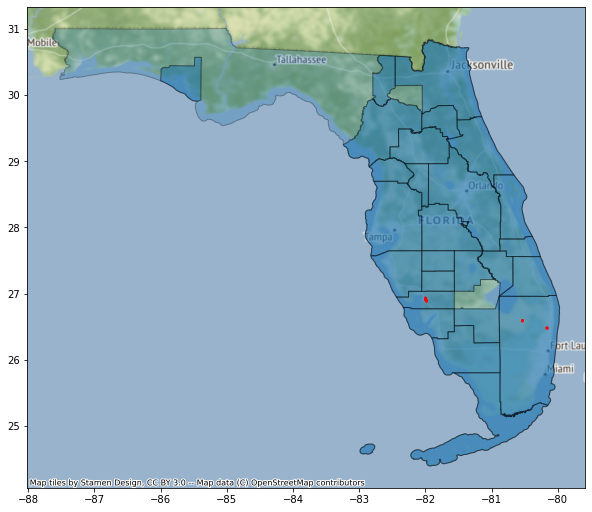

Total images:  44
                                                     0
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area  15
Punta Gorda, FL Metro Area                          29

2019: 


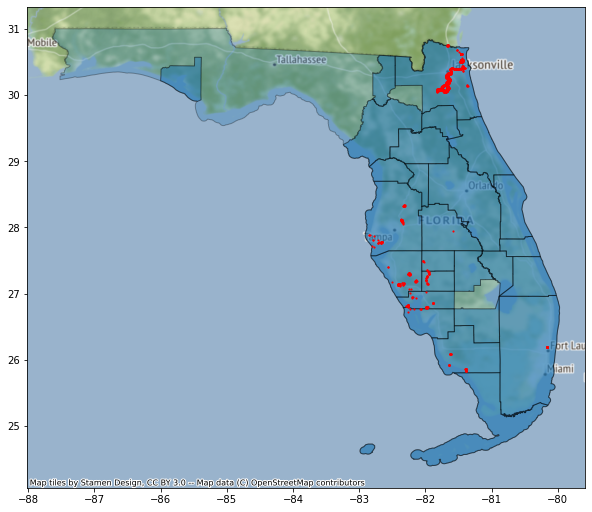

Total images:  919
                                                      0
Tampa-St. Petersburg-Clearwater, FL Metro Area       76
Lakeland-Winter Haven, FL Metro Area                  1
Naples-Marco Island, FL Metro Area                   32
Punta Gorda, FL Metro Area                           59
North Port-Sarasota-Bradenton, FL Metro Area         83
Jacksonville, FL Metro Area                         611
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area   19
Cape Coral-Fort Myers, FL Metro Area                  4
Wauchula, FL Micro Area                               7
Arcadia, FL Micro Area                               27


(None, None, None)

In [52]:
print('2018: ')
state_plotter('FL', image_metadata_gdf, '2018', False)

print('\nAUGUST 2018: ')
state_plotter('FL', image_metadata_gdf, '2018-08', False)
print('\nSEPTEMBER 2018: ')
state_plotter('FL', image_metadata_gdf, '2018-09', False)
print('\nOCTOBER 2018: ')
state_plotter('FL', image_metadata_gdf, '2018-10', False)
print('\nNOVEMBER 2018: ')
state_plotter('FL', image_metadata_gdf, '2018-11', False)
print('\nDECEMBER 2018: ')
state_plotter('FL', image_metadata_gdf, '2018-12', False)

print('\n2019: ')
state_plotter('FL', image_metadata_gdf, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images

In [53]:
months_with_images('FL', human_labeled_floods, '2018')

{'October': 154, 'September': 1, 'August': 5, 'November': 1, 'April': 1}


In [54]:
months_with_images('FL', human_labeled_floods, '2019')

{'September': 76, 'July': 5, 'June': 2, 'March': 3, 'April': 4, 'May': 3}


2018: 


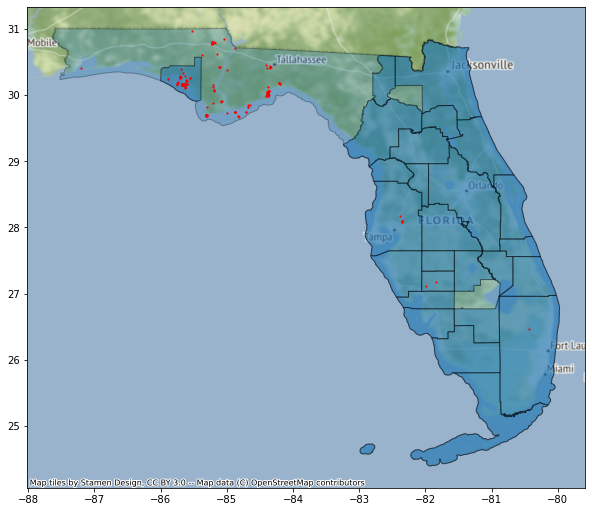

Total images:  162
                                                      0
NaN                                                 103
Panama City, FL Metro Area                           51
Miami-Fort Lauderdale-Pompano Beach, FL Metro Area    1
Tampa-St. Petersburg-Clearwater, FL Metro Area        5
Arcadia, FL Micro Area                                2

OCTOBER 2018: 


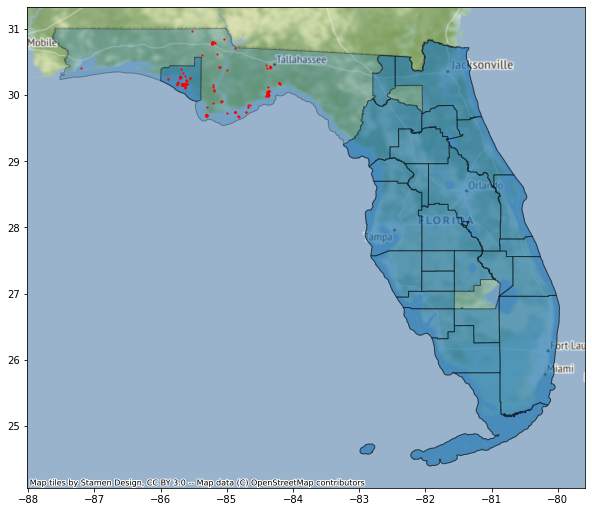

Total images:  154
                              0
NaN                         103
Panama City, FL Metro Area   51

NOVEMBER 2018: 


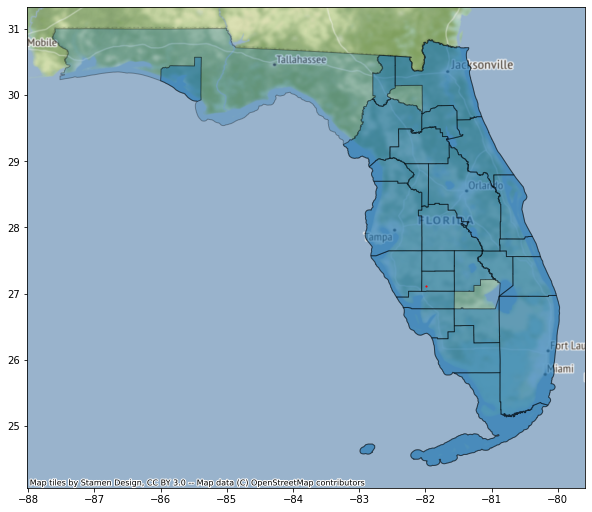

Total images:  1
                        0
Arcadia, FL Micro Area  1

2019: 


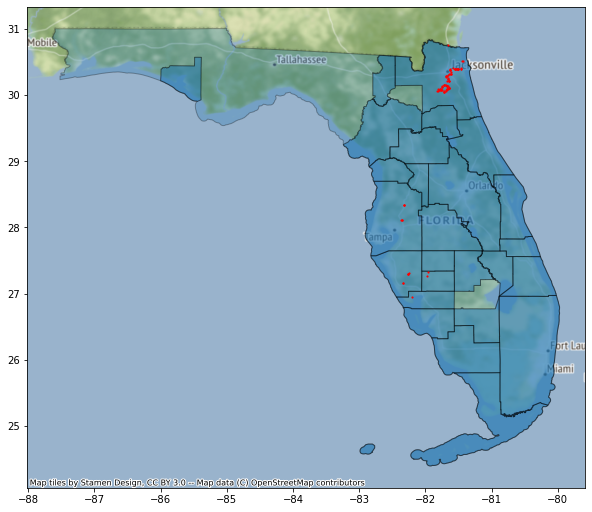

Total images:  93
                                                 0
Jacksonville, FL Metro Area                     78
Arcadia, FL Micro Area                           2
Tampa-St. Petersburg-Clearwater, FL Metro Area   6
North Port-Sarasota-Bradenton, FL Metro Area     6
Punta Gorda, FL Metro Area                       1


(None, None, None)

In [55]:
print('2018: ')
state_plotter('FL', human_labeled_floods, '2018', False)

print('\nOCTOBER 2018: ')
state_plotter('FL', human_labeled_floods, '2018-10', False)
print('\nNOVEMBER 2018: ')
state_plotter('FL', human_labeled_floods, '2018-11', False)

print('\n2019: ')
state_plotter('FL', human_labeled_floods, '2019', False)
#black circles represent the given buffer radius for the airports
#red dots are points for disaster images